In [3]:
import json
import random
from urllib.request import urlopen

# storing and anaysis
import numpy as np
import pandas as pd

# visualization
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.figure_factory as ff
import calmap
import folium
from pandas.plotting import register_matplotlib_converters
register_matplotlib_converters()   

# hide warnings
import warnings
warnings.filterwarnings('ignore')

In [19]:
!pip install dash

In [2]:
full_table = pd.read_table(r'D:\dwon\valeursfoncieres-2021.txt',sep='|',parse_dates=['Date mutation'])
full_table.head()

,Code service CH,Reference document,1 Articles CGI,2 Articles CGI,3 Articles CGI,4 Articles CGI,5 Articles CGI,No disposition,Date mutation,Nature mutation,...,Surface Carrez du 5eme lot,Nombre de lots,Code type local,Type local,Identifiant local,Surface reelle bati,Nombre pieces principales,Nature culture,Nature culture speciale,Surface terrain
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2021-05-01,Vente,...,NaN,0,1.0,Maison,NaN,97.0,5.0,S,NaN,2410.0
1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2021-05-01,Vente,...,NaN,0,3.0,Dépendance,NaN,0.0,0.0,S,NaN,2410.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2021-06-01,Vente,...,NaN,0,NaN,NaN,NaN,NaN,NaN,BT,NaN,530.0
3,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2021-04-01,Vente,...,NaN,0,1.0,Maison,NaN,88.0,4.0,S,NaN,866.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1,2021-06-01,Vente,...,NaN,0,1.0,Maison,NaN,168.0,5.0,S,NaN,1426.0


# cleaning data

In [33]:
full_table.isna().sum()

No disposition                      0
Date mutation                       0
Nature mutation                     0
Valeur fonciere                 32780
No voie                       1189446
B/T/Q                         3219148
Type de voie                  1275146
Code voie                       31951
Voie                            32386
Code postal                     32050
Commune                             0
Code departement                    0
Code commune                        0
Prefixe de section            3255458
Section                           168
No plan                             0
No Volume                     3371789
1er lot                       2328039
Surface Carrez du 1er lot     3068652
2eme lot                      3067321
Surface Carrez du 2eme lot    3280272
3eme lot                      3322900
Surface Carrez du 3eme lot    3368183
4eme lot                      3360936
Surface Carrez du 4eme lot    3376497
5eme lot                      3371401
Surface Carr

In [3]:
# on recuperer uniquement les colonne qui ont moins de 10% de nan

clear_table=full_table[["Date mutation","Nature mutation","Valeur fonciere","Type de voie","Nombre de lots","Commune","Code departement","No plan","Code type local","Surface reelle bati","Nature culture","Nature culture speciale","Surface terrain"]]
clear_table.head()


,Date mutation,Nature mutation,Valeur fonciere,Type de voie,Nombre de lots,Commune,Code departement,No plan,Code type local,Surface reelle bati,Nature culture,Nature culture speciale,Surface terrain
0,2021-05-01,Vente,"185000,00",CHE,0,VAL-REVERMONT,1,122,1.0,97.0,S,NaN,2410.0
1,2021-05-01,Vente,"185000,00",CHE,0,VAL-REVERMONT,1,122,3.0,0.0,S,NaN,2410.0
2,2021-06-01,Vente,"10,00",NaN,0,BEY,1,204,NaN,NaN,BT,NaN,530.0
3,2021-04-01,Vente,"204332,00",ALL,0,BUELLAS,1,1325,1.0,88.0,S,NaN,866.0
4,2021-06-01,Vente,"320000,00",RTE,0,MONTAGNAT,1,11,1.0,168.0,S,NaN,1426.0


# Annalyse du prix en fonction des dates

<AxesSubplot:xlabel='Date mutation'>

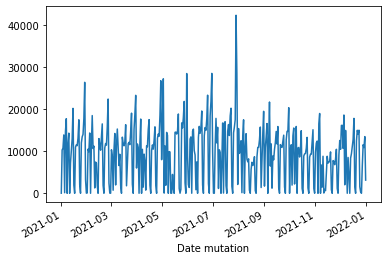

In [24]:
table=clear_table.copy()
test=table.groupby(['Date mutation'])['Nature mutation'].count()
test.plot()

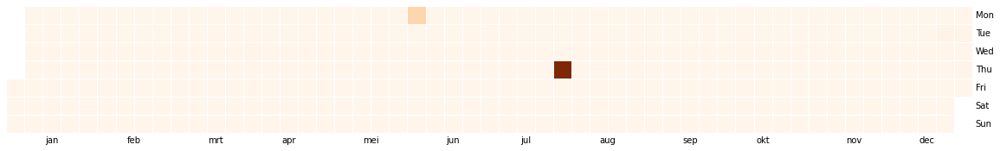

In [14]:
df["Date mutation"] = pd.to_datetime(df["Date mutation"])
temp=df.groupby(['Date mutation'])['Valeur fonciere'].sum()

plt.figure(figsize=(20, 5))
ax = calmap.yearplot(temp, fillcolor='white', cmap='Oranges', linewidth=0.5)

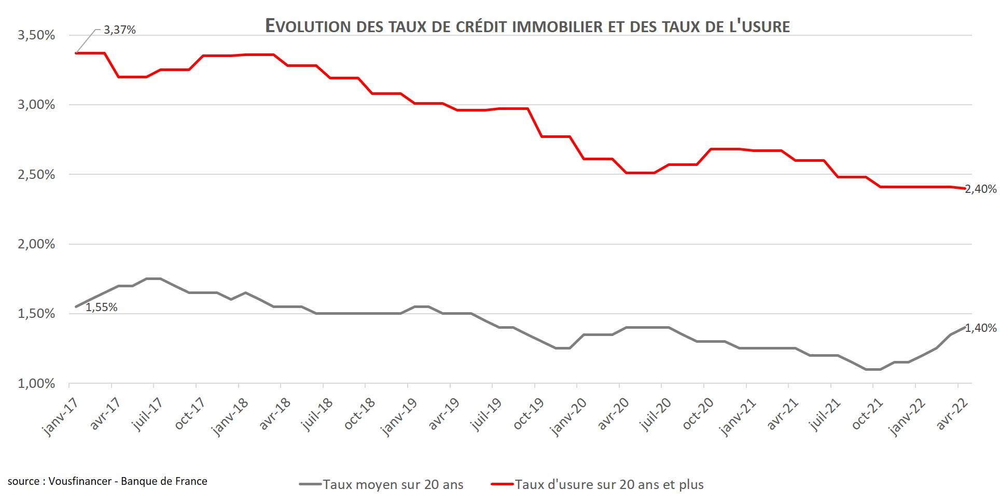

On remarque une baisse significative des taux de creedit immobilier vers juillet 2021 impliquant une facilité pour les particulier de souscraire un pret pour acheter un bien impliquant donc ce pique siginificatif

# Nombre de vente par region 

In [32]:
geo=json.load(open("D:/dwon/projetpython/region.geojson"))

In [46]:
francecoord=folium.Map(location=[48.856578,2.351828],zoom_start=5.5)
clear_table['Code departement']=clear_table['Code departement'].astype(str)
table=clear_table.groupby(['Code departement'])['Nature mutation'].count()
francecoord.choropleth(geo_data=geo, key_on="feature.properties.code", data=table,columns=['Code departement','Nature mutation']
                      ,fill_color="Spectral")
francecoord

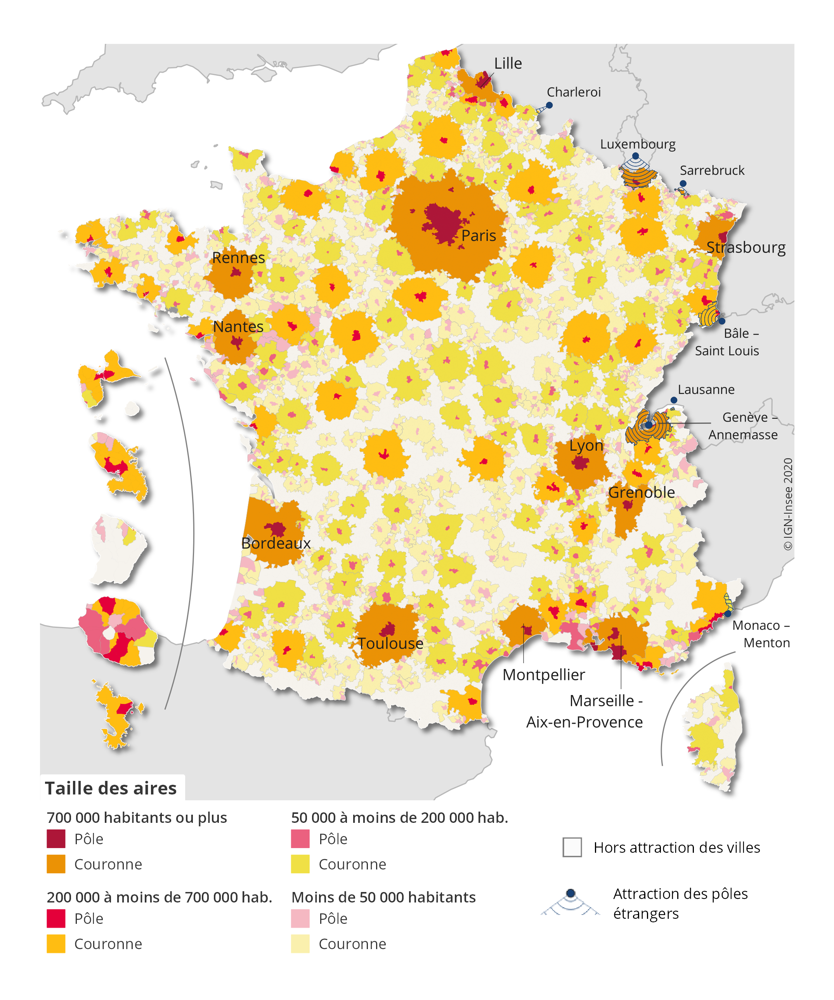


On remarque donc qu'en 2021 les zones aux alentours des grandes villes reste les plus attractive impliquant donc un nombre plus conséquent de vente sur l'annnée 

# Taux des différents types de mutations

<AxesSubplot:ylabel='Nature mutation'>

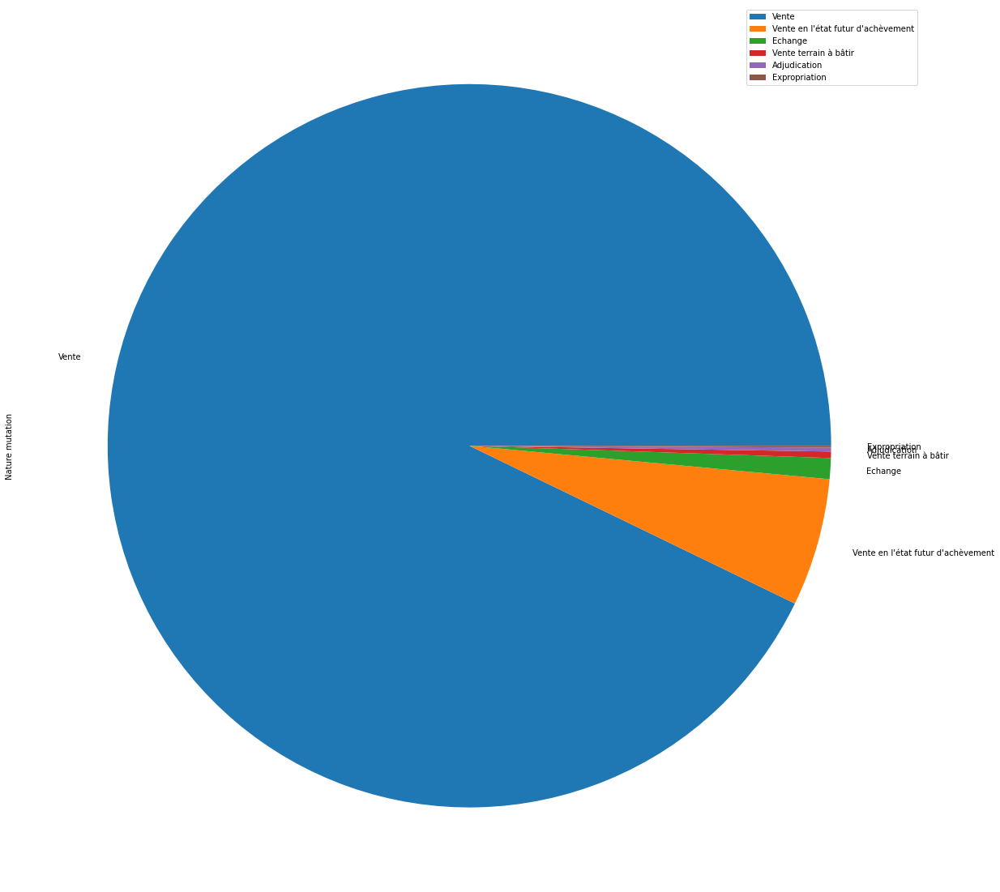

In [31]:
NM=clear_table['Nature mutation'].value_counts() 
from matplotlib import pyplot
pyplot.axis('equal')
NM.plot(kind='pie',legend=True,figsize=(20,20))

In [26]:
clear_table['Nature mutation'].value_counts()

Vente                                 3136416
Vente en l'état futur d'achèvement     193014
Echange                                 31564
Vente terrain à bâtir                    9617
Adjudication                             5941
Expropriation                            2680
Name: Nature mutation, dtype: int64

# Nombre d'expropriation par region

In [47]:
tablese=clear_table.copy()
tablese.rename(columns = {'Nature mutation':'NM'},inplace = True)
newdf = tablese[(tablese.NM == "Expropriation")]



francexpr=folium.Map(location=[48.856578,2.351828],zoom_start=5.5)
newdf['Code departement']=newdf['Code departement'].astype(str)
table=newdf.groupby(['Code departement'])['NM'].count()
francexpr.choropleth(geo_data=geo, key_on="feature.properties.code", data=table,columns=['Code departement','NM']
                      ,fill_color="Spectral")
francexpr

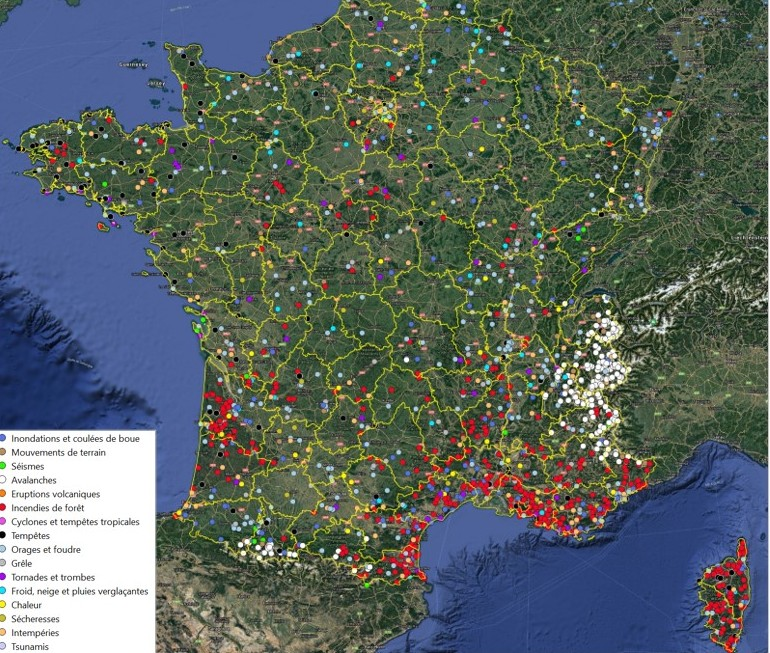

# Coopropriété en France

In [48]:
tablese=clear_table.copy()
tablese.rename(columns = {'Nombre de lots':'ndl'},inplace = True)
newdf = tablese[(tablese.ndl>0)]



francexpr=folium.Map(location=[48.856578,2.351828],zoom_start=5.5)
newdf['Code departement']=newdf['Code departement'].astype(str)
table=newdf.groupby(['Code departement'])['ndl'].count()
francexpr.choropleth(geo_data=geo, key_on="feature.properties.code", data=table,columns=['Code departement','ndl']
                      ,fill_color="Spectral")
francexpr

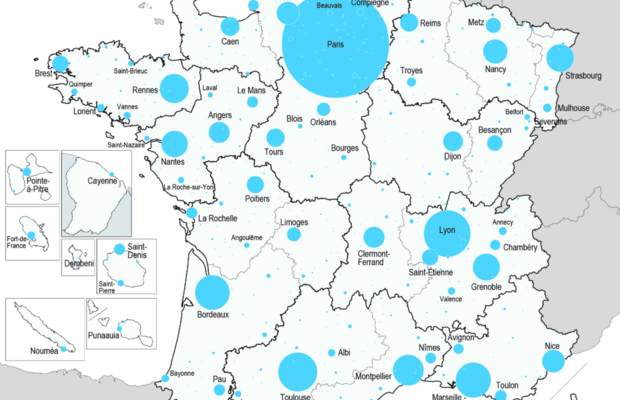

## Répartition des valeurs foncières

In [4]:
df=pd.read_csv("data utilisable.csv")

In [6]:

#convertir le type de Valeur fonciere de str --> float64
import locale
locale.setlocale(locale.LC_ALL, 'nl_NL')
df['Valeur fonciere']=df['Valeur fonciere'].apply(lambda x : locale.atof(str(x)))
#
temp=df.groupby("Type de voie")['Valeur fonciere','Surface terrain'].sum().sort_values(by='Valeur fonciere',ascending=False)
temp["voie"]=temp.index
valeur_fonciere_total=temp["Valeur fonciere"].sum()
print(f"la valeur fonciere totale échangé cette année est {valeur_fonciere_total} euros")
temp["valeur fonciere %"]=temp["Valeur fonciere"].apply(lambda x:(x/valeur_fonciere_total)*100)
temp


la valeur fonciere totale échangé cette année est 6278338964152.69 euros


,Valeur fonciere,Surface terrain,voie,valeur fonciere %
Type de voie,,,,
RUE,4.092743e+12,614703414.0,RUE,6.518831e+01
AV,1.011733e+12,111497912.0,AV,1.611467e+01
CHE,2.414344e+11,116814304.0,CHE,3.845513e+00
RTE,2.191816e+11,144221264.0,RTE,3.491076e+00
PL,1.265968e+11,8361187.0,PL,2.016405e+00
...,...,...,...,...
BRE,7.800000e+04,212.0,BRE,1.242367e-06
COIN,7.000000e+04,30.0,COIN,1.114945e-06
HLG,1.250000e+04,653.0,HLG,1.990972e-07


In [11]:
fig=px.bar(temp.head(6),
          y='voie', x='valeur fonciere %', title = ' Valeur fonciere / type de voie',
           text='valeur fonciere %', orientation='h', width=700, height=700          )
fig.update_traces(marker_color='red', opacity=0.6, textposition='outside')
fig.show()

In [17]:
temp=df.groupby("Type de voie")["Surface terrain",'Surface reelle bati'].sum()
temp=temp.reset_index(drop=False)
fig=px.treemap(temp,path=['Type de voie'], values="Surface terrain", height=700,title="Surface terrain en m² totale par type de voie", color_discrete_sequence = px.colors.qualitative.Dark2)
fig.data[0].textinfo = 'label+value+percent parent'
fig.show()

In [16]:
fig=px.treemap(temp,path=['Type de voie'], values="Surface reelle bati", height=700,title="Surface reelle bati en m² totale par type de voie", color_discrete_sequence = px.colors.qualitative.Dark2)


fig.data[0].textinfo = 'label+value+percent parent'
fig.show()

In [2]:
data = urlopen("https://france-geojson.gregoiredavid.fr/repo/departements.geojson").read()
geo = json.loads(data.decode('utf-8'))

dm = pd.read_csv('data.csv')
dm = dm.drop(['Unnamed: 0'],axis=1)
dm["Date mutation"] = dm["Date mutation"].astype('datetime64[ns]')
dm["Code departement"] = dm["Code departement"].astype(str)

/Users/steven/opt/anaconda3/lib/python3.9/site-packages/IPython/core/interactiveshell.py:3444: DtypeWarning: Columns (6) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


## Tableau représentatif de la concentration des terrains par département

#### On peut voir que les départements avec le moins de place sont celle intégrant une grande urbanisation (grande ville)...
#### car ils ont un grand nombre de terrains.

In [3]:
test = 100*(1 - (dm.groupby(['Code departement'])['Surface reelle bati'].mean() / dm.groupby(['Code departement'])['Surface terrain'].mean())).round(2)
test1 = pd.DataFrame(test)
test1.columns = ['Pourcentage de surface libre sur les terrains']
test1['Nombre de terrain'] = dm.groupby(['Code departement'])['Surface reelle bati'].count()
test1['Code departement'] = test1.index
cols = test1.columns.tolist()
cols = cols[-1:] + cols[:-1]
test1 = test1[cols]
test1 = test1.sort_values(by='Pourcentage de surface libre sur les terrains', ascending=True).reset_index(drop = True)
test1.style.background_gradient(cmap='Reds')

,Code departement,Pourcentage de surface libre sur les terrains,Nombre de terrain
0,94,93.000000,43856
1,59,94.000000,83808
2,7,94.000000,1854
3,90,95.000000,5264
4,62,95.000000,31528
5,78,95.000000,39490
6,77,95.000000,53824
7,91,95.000000,42343
8,73,95.000000,25200
9,56,96.000000,23574


## Surface vendu par date et département

### On peut mettre en lien nombre d'achat de terrain avec le taux de crédit immobilier

In [4]:
fg = dm.groupby(['Code departement','Date mutation'])['Surface terrain'].sum()
fg = fg.reset_index()
fg
fig = px.bar(fg, x="Date mutation", y="Surface terrain", color='Code departement', orientation='v', height=600,
             title='Surface par date et le département', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

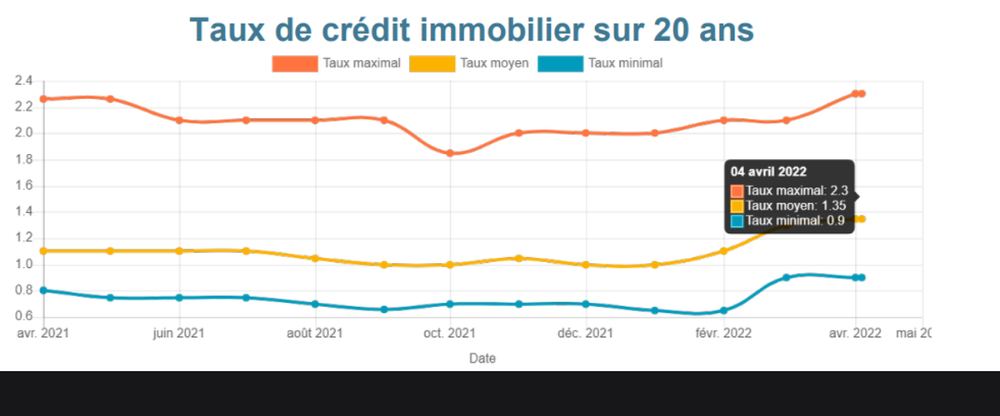

## La surface des département

#### Les plus grands départements ne sont pas forcément ceux qui ont des grandes villes (départements avec des terrains agricoles).

In [6]:
##On peut voir les pics de ventes en été

fig = px.treemap(fg.sort_values(by='Surface terrain' ,ascending=False).reset_index(drop=True), path=["Code departement"], values="Surface terrain", height=700,title='Surface/Departement',color_discrete_sequence = px.colors.qualitative.Prism)
fig.data[0].textinfo = 'label+text+value'
fig.show()

### Vente de terrain type culture selon la date

#### On peut voir que en été l'investiment dans la culture est plus haut, qui est aussi la période oû l'économie en rapport à l'argréculture et l'écologie est à son fort

In [7]:
fg = dm
fg.dropna(subset = ["Nature culture"], inplace=True)
fg = fg.groupby(['Date mutation'])['Nature culture'].count()
fg = fg.reset_index()
fg
fig = px.bar(fg, x="Date mutation", y="Nature culture", color='Nature culture', orientation='v', height=600,
             title='Vente de type culture par date', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

In [8]:
fg = dm
fg.dropna(subset = ["Nature culture"], inplace=True)
fg["Valeur fonciere"] = fg["Valeur fonciere"].astype(str)
fg["Valeur fonciere"] = fg["Valeur fonciere"].apply(lambda x : float(x.replace(',','.')))
fg = fg.groupby(['Nature culture','Date mutation'])['Valeur fonciere'].sum()
fg = fg.reset_index()
fig = px.bar(fg, x="Date mutation", y="Valeur fonciere", color='Nature culture', orientation='v', height=600,
             title='Investiment de type nature culture par date', color_discrete_sequence = px.colors.cyclical.mygbm)
fig.show()

## Carte de la france selon le nombre de vente liée à la 'nature culture'

In [9]:
francecoord=folium.Map(location=[48.856578,2.351828])
table=dm.groupby(['Code departement'])['Nature mutation'].count()
francecoord.choropleth(geo_data=geo, key_on="feature.properties.code", data=table,columns=['Code departement','Nature mutation']
                      ,fill_color="Spectral")
francecoord

/Users/steven/opt/anaconda3/lib/python3.9/site-packages/folium/folium.py:409: FutureWarning:

The choropleth  method has been deprecated. Instead use the new Choropleth class, which has the same arguments. See the example notebook 'GeoJSON_and_choropleth' for how to do this.



#### Cartes représentatifs des espaces agricoles

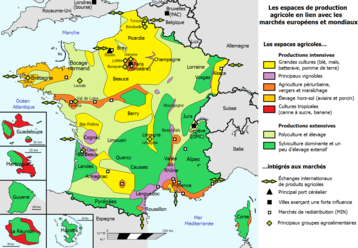